# Transformers for Video Game Image Super Resolution


**Video Game Super-Resolution** (VGSR)  
Eric Phann, Samantha Michael, Kidus Kidane  
DSBA 6127: AI & Deep Learning


## Introduction

This notebook will explore transformers as a newer, state-of-the-art architecture for video game image super-resolution. The intuition for this is that attention mechanisms will be useful for better detail preservation and prediction as opposed to more traditional methods like convolutional neural networks (CNNs) or generative adversarial networks (GANs).

We will refer to ["Swin IR: Image Restoration Using Swin Transformer"](https://arxiv.org/abs/2108.10257) as baseline research and model for this approach in our project.  

We will also look at ["Swin2SR: SwinV2 Transformer for Compressed
Image Super-Resolution and Restoration"](https://arxiv.org/pdf/2209.11345) as an updated version of the Swin model specifically for image super-resolution and restoration.

## SwinIR

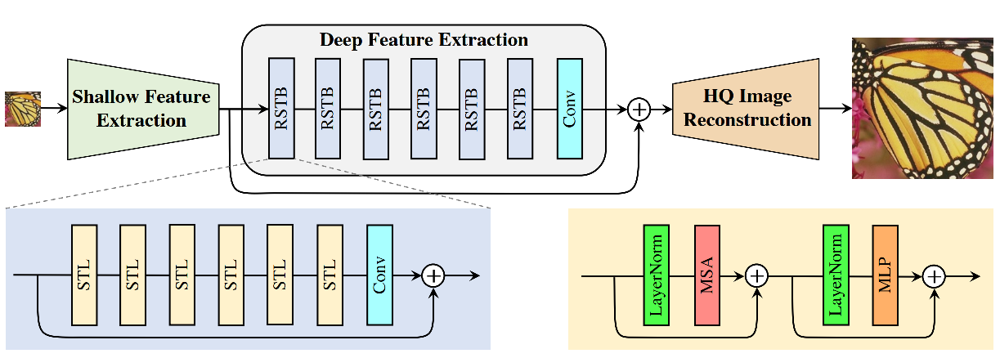

As you can see in the diagram shown, SwinIR is composed of three parts:
- Shallow feature extraction
- Deep feature extraction
- HQ image reconstruction

The deep feature extraction module contains several residual Swin Transformer blocks (RSTB) which consist of several Swin Transformer layers together with a residual connection.  

For reference, a **Swin** Transformer is a hierarchical vision transformer using "**S**hifted **Win**dows". For more info, read the paper [here](https://arxiv.org/abs/2103.14030).


## Swin2SR

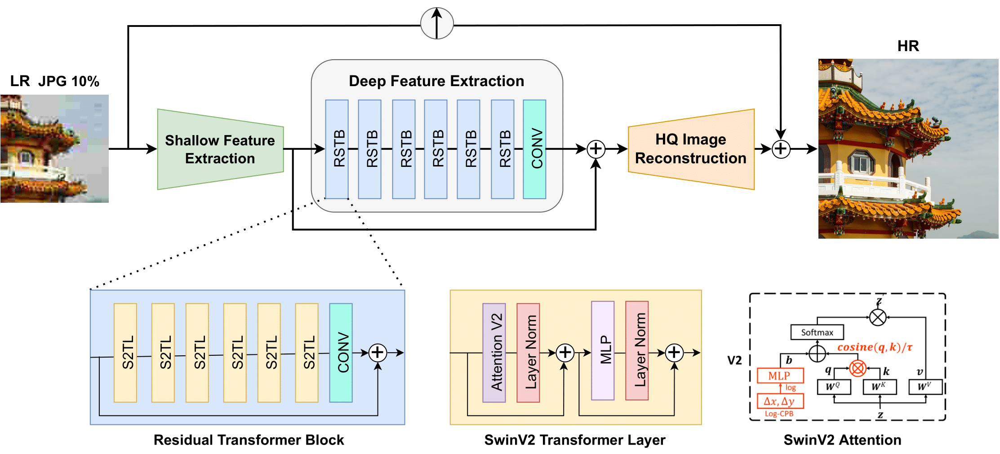

Swin2SR is a new version to the original SwinIR architecture, utilizing the new SwinV2 Transformer (more info [here](https://arxiv.org/abs/2111.09883)). This version has improved training performance for Super Resolution tasks, such as those in our project by up to 33% due to:  
- Post Normalization (instead of Pre Normalization)
- Scaled Cosine Attention (instead of dot product)
- Log-spaced continuous relative position bias

## Cost / Loss Function

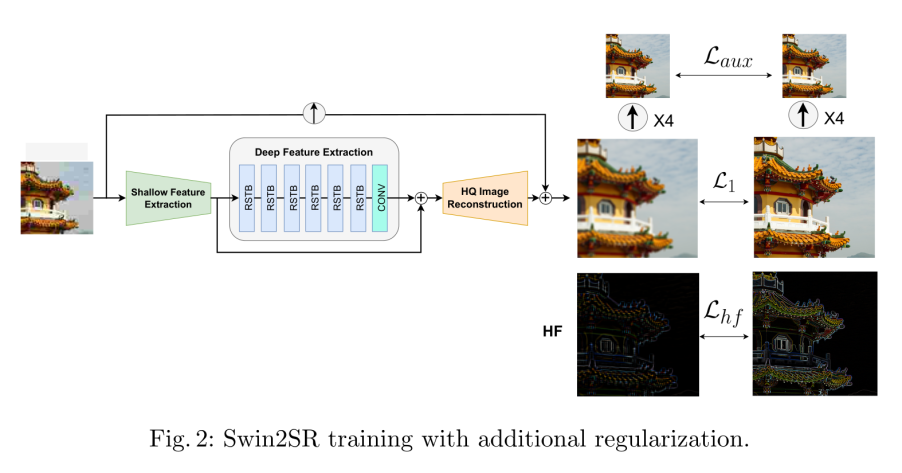

As you can see, Swin2SR uses 3 approaches to cost / loss functions:  
- **L1 loss** for reconstruction input vs. reference (baseline)
- **Laux** which minimizes L1 distance on *downsampled* input/reference (approach 2)
- **High-frequency (HF) feature extraction + Laux** (approach 3)

## Hyperparameters

As mentioned in the paper, the hyperparameters for this architecture are the RSTB number (# of blocks), S2TL number (# of Swins per block), window size, channel number, and attention head number.  

These hyperparameters are generally set as follows:  
- RSTB number = 6
- S2TL number = 6
- Window Size = 8
- Channel Number = 180
- Attention Head number = 6

## Import the model

First, install Transformers.

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


Now, load Swin2SR model from Hugging Face. This model will upscale the image 2x.

In [2]:
from transformers import Swin2SRForImageSuperResolution

model = Swin2SRForImageSuperResolution.from_pretrained("caidas/swin2SR-classical-sr-x4-64")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/49.1M [00:00<?, ?B/s]

## Upload Images

Since we have our images loaded to Hugging Face, we can easily import and download a few to try.

Let's see a low resolution video game image.

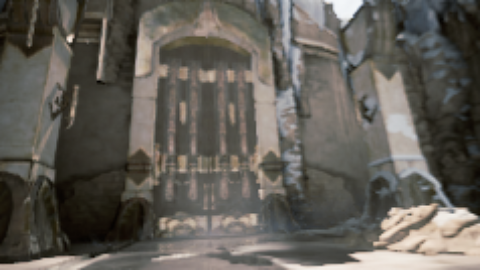

In [3]:
import requests
from PIL import Image

url = "https://huggingface.co/datasets/ericphann/video-game-super-resolution/resolve/main/training-lr/00000.png"

lr = Image.open(requests.get(url, stream=True).raw)
lr

Let's see the high resolution equivalent.

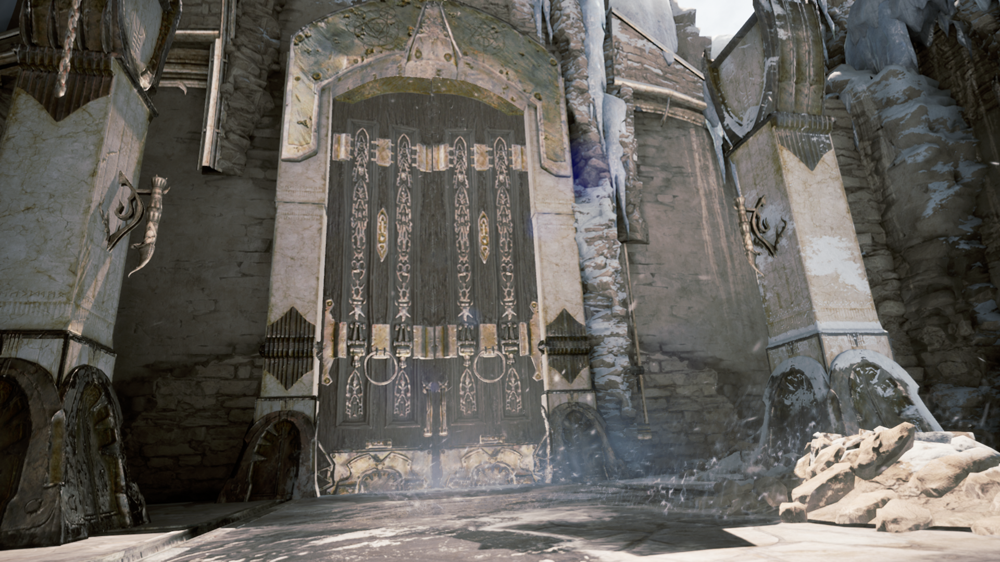

In [4]:
url = "https://huggingface.co/datasets/ericphann/video-game-super-resolution/resolve/main/training-hr/00000.png"

hr = Image.open(requests.get(url, stream=True).raw)
hr

## Prepare image

In [5]:
from transformers import AutoImageProcessor

processor = AutoImageProcessor.from_pretrained("caidas/swin2SR-classical-sr-x4-64")

preprocessor_config.json:   0%|          | 0.00/152 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [6]:
pixel_values = processor(lr, return_tensors="pt", input_data_format="channels_last").pixel_values
pixel_values = pixel_values[:, :3, :, :]  # drop alpha from RGBA -> RGB
print(pixel_values.shape)

torch.Size([1, 3, 272, 488])


## Inference

In [7]:
import torch

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
inputs = pixel_values.to(device)

with torch.no_grad():
    outputs = model(inputs)

# model.to("cpu")
# inputs.to("cpu")

## Visualize

The model outputs an upscaled version of our input image.

In [9]:
outputs.reconstruction.shape

torch.Size([1, 3, 1088, 1952])

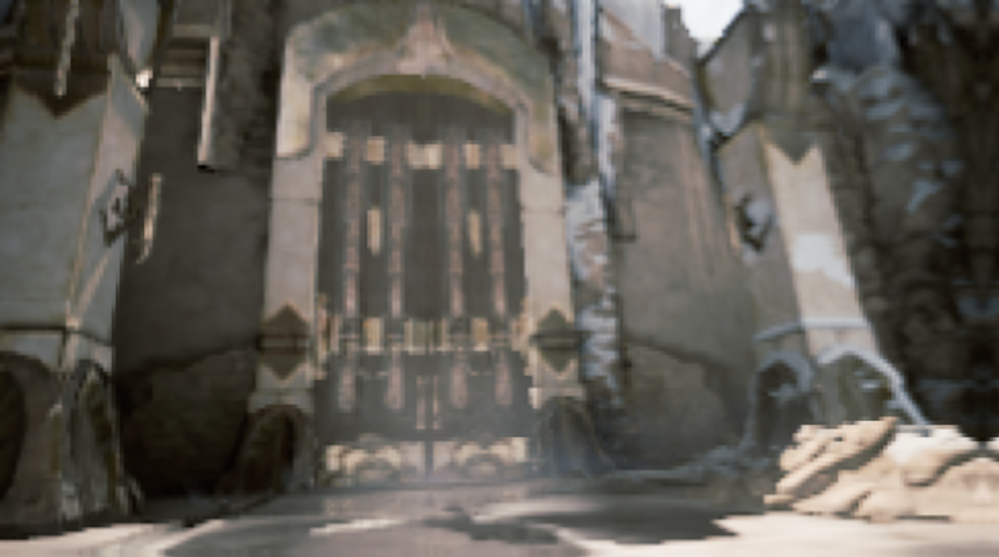

In [10]:
import numpy as np

output = outputs.reconstruction.data.squeeze().float().cpu().clamp_(0, 1).numpy()
output = np.moveaxis(output, source=0, destination=-1)
output = (output * 255.0).round().astype(np.uint8)  # float32 to uint8
hr_pred = Image.fromarray(output)
hr_pred

## Evaluate

Now let's evaluate the model prediction against our ground truth image. We will use two metrics:  
- **PSNR**: Peak signal-to-noise ratio, basic numerical measure of similarity. Simple and fast but doesn't reflect human perception well.
- **SSIM**: Structural similarity index, slightly slower than PSNR, but more reliable for perceptual quality as opposed to numerical accuracy.

First, let's import everything we will need.

In [11]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
from math import log10, sqrt

Now, let's create a `psnr` function.

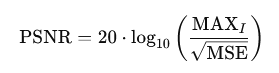

In [12]:
def calculate_psnr(img1, img2):
    img1 = np.array(img1).astype(np.float32)
    img2 = np.array(img2).astype(np.float32)
    mse = np.mean((img1 - img2) ** 2)

    if mse == 0:
        return float('inf')
    return 20 * log10(255.0 / sqrt(mse))

Next, let's create a `ssim` function.

In [13]:
def calculate_ssim(img1, img2):
    img1 = np.array(img1)
    img2 = np.array(img2)
    return ssim(img1, img2, channel_axis=-1, data_range=255)

Since our ground truth hi-res is in a different resolution (and shape) than the prediction, let's resize it.

In [14]:
hr_resized = hr.convert('RGB')

In [15]:
hr_resized = hr_resized.resize(hr_pred.size, Image.BICUBIC)

Now, let's generate our metrics.

In [16]:
psnr_val = calculate_psnr(hr_resized, hr_pred)
ssim_val = calculate_ssim(hr_resized, hr_pred)

print(f"PSNR: {psnr_val:.2f} dB")
print(f"SSIM: {ssim_val:.4f}")

PSNR: 17.85 dB
SSIM: 0.4825


Interpreting these metrics:  
- The higher PSNR, the better. 17.93 is pretty poor and suggests a notable difference between the ground truth and prediction.
- The higher SSIM (range 0 to 1) the better. 0.3804 suggests low structural similarity, the overall output is still blurry.

Here's an example of PSNR in dB.  

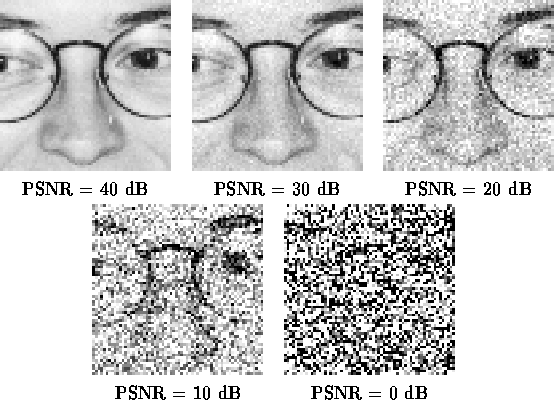

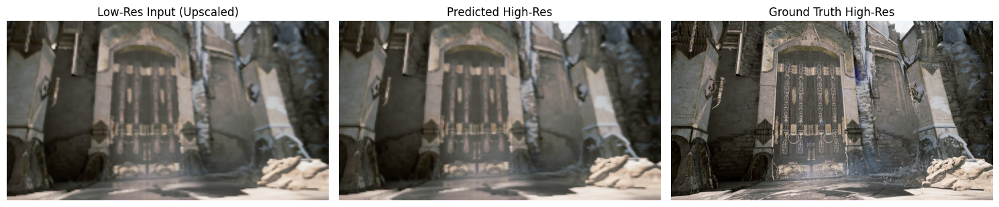

In [17]:
import matplotlib.pyplot as plt

# Resize low-res to match HR image size for comparison
lr = lr.convert('RGB')
lr_upscaled = lr.resize(hr_pred.size, Image.BICUBIC)

plt.figure(figsize=(15, 5))
titles = ["Low-Res Input (Upscaled)", "Predicted High-Res", "Ground Truth High-Res"]
images = [lr_upscaled, hr_pred, hr_resized]

for i, (title, img) in enumerate(zip(titles, images)):
    plt.subplot(1, 3, i + 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()


Just from initial impressions, it is not as good as we'd like. It is still pretty blurry despite a "higher resolution." Below, we will improve our baseline, pre-trained model by fine-tuning it on our dataset.

## Fine-Tuning

First, let's import our dataset from Hugging Face. The images are available [here](https://huggingface.co/datasets/ericphann/video-game-super-resolution).

In [18]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 20.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 22.1 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which

In [68]:
from datasets import load_dataset

dataset_hr = load_dataset("ericphann/video-game-super-resolution", data_dir="training-hr", split="train", streaming=True)
dataset_hr_head = list(dataset_hr.take(250))

Resolving data files:   0%|          | 0/10000 [00:00<?, ?it/s]

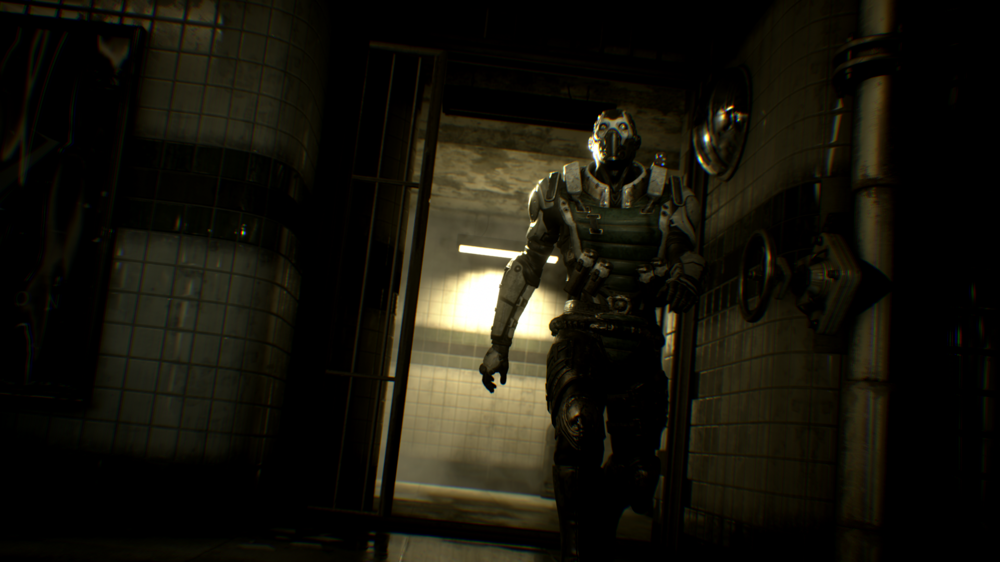

In [69]:
dataset_hr_head[1]['image']

In [70]:
from datasets import load_dataset

dataset_lr = load_dataset("ericphann/video-game-super-resolution", data_dir="training-lr", split="train", streaming=True)
dataset_lr_head = list(dataset_lr.take(250))

Resolving data files:   0%|          | 0/10000 [00:00<?, ?it/s]

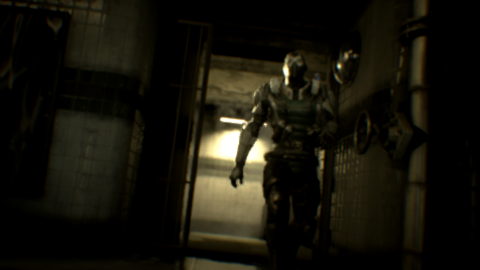

In [71]:
dataset_lr_head[1]['image']

Let's define a function that will help us process and combine our LR and HR image datasets so that we can properly fine-tune our model.

In [72]:
from torch.utils.data import Dataset

In [73]:
class SuperResolutionDataset(Dataset):
    def __init__(self, dataset_lr, dataset_hr, processor_lr, processor_hr):
        self.dataset_lr = dataset_lr
        self.dataset_hr = dataset_hr
        self.processor_lr = processor_lr
        self.processor_hr = processor_hr

    def __len__(self):
        return len(self.dataset_lr)

    def __getitem__(self, idx):
        # print(f"Getting index {idx}")
        lr = self.dataset_lr[idx]['image']
        hr = self.dataset_hr[idx]['image']

        pixel_values = processor_lr(lr, return_tensors="pt", input_data_format="channels_last").pixel_values
        pixel_values = pixel_values[:, :3, :, :]  # drop alpha from RGBA -> RGB

        labels = processor_hr(hr, return_tensors="pt", input_data_format="channels_last").pixel_values
        labels = labels[:, :3, :, :]  # drop alpha from RGBA -> RGB

        return pixel_values, labels

In [74]:
from transformers import AutoImageProcessor
import torch

processor_lr = AutoImageProcessor.from_pretrained("caidas/swin2SR-classical-sr-x4-64", pad_size=8)
processor_hr = AutoImageProcessor.from_pretrained("caidas/swin2SR-classical-sr-x4-64", pad_size=32)

In [75]:
train_dataset = SuperResolutionDataset(dataset_lr_head, dataset_hr_head, processor_lr, processor_hr)

Much of the code below will be leveraging the Hugging Face `transformers` library.

Let's define our hyperparameters (we will revisit and optimize these later on). We will be using low epochs and batches for efficiency.

In [76]:
# from transformers import TrainingArguments

In [77]:
# training_args = TrainingArguments(
#     output_dir="./swin2sr-finetuned",
#     save_strategy="epoch",
#     per_device_train_batch_size=2,
#     num_train_epochs=5,
#     learning_rate=5e-5,
#     weight_decay=0.01,
#     save_total_limit=1,
#     remove_unused_columns=False,
#     push_to_hub=False,
#     report_to="none"
# )

Now let's define our Trainer.

In [78]:
# from transformers import Trainer

In [79]:
# trainer = Trainer(
#     model=model,
#     args=training_args,
#     train_dataset=train_dataset,
# )

Time to train! Remember to enable GPU and use CUDA!!

In [80]:
# trainer.train()
# NotImplementedError: Training is not supported at the moment

Looks like they haven't implemented the forward pass for finetuning yet! We will make our own training loop using PyTorch.

We will freeze all parameters, then unfreeze the upsample layer and the last couple of layers in the model for efficiency. We assume the model has sufficiently pretrained on the general features and needs tuning to our specific domain (video-games).

In [163]:
# Model
# torch.cuda.empty_cache()
model = Swin2SRForImageSuperResolution.from_pretrained("caidas/swin2SR-classical-sr-x4-64")

# Freeze all model parameters
for param in model.parameters():
    param.requires_grad = False

# Unfreeze only the head (upsample layer)
for param in model.upsample.parameters():
    param.requires_grad = True

# Let's unfreeze the last two layers of the last stage
for param in model.swin2sr.encoder.stages[-1].layers[-2:]:
    param.requires_grad = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
torch.cuda.empty_cache()

We use the following code block to ensure our vRAM is cleared and can accomodate our model and training.

In [164]:
pixel_values = None
labels = None
optimizer = None
train_dataloader = None
progress_bar = None
preds = None
# train_dataset = None
# model = None

import gc
gc.collect()
torch.cuda.empty_cache()

We will use Charbonnier Loss as a "soft" L1. You may attempt to use MSE, but it did not produce material results in our experience.

In [146]:
class CharbonnierLoss(torch.nn.Module):
    """Charbonnier Loss (L1 variant)"""
    def __init__(self, eps=1e-6):
        super(CharbonnierLoss, self).__init__()
        self.eps = eps

    def forward(self, pred, target):
        return torch.mean(torch.sqrt((pred - target) ** 2 + self.eps))

In [160]:
import torch
import torch.nn.functional as F

class PSNRLoss(torch.nn.Module):
    def __init__(self, max_val=1.0):
        super(PSNRLoss, self).__init__()
        self.register_buffer('max_val', torch.tensor(max_val))

    def forward(self, pred, target):
        mse = F.mse_loss(pred, target, reduction='mean')
        psnr = 20 * torch.log10(self.max_val) - 10 * torch.log10(mse + 1e-8)
        return -psnr  # We NEGATE because we want to MINIMIZE the loss


In [165]:
import torch
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
from transformers import Swin2SRForImageSuperResolution

# Hyperparameters
num_epochs = 10
learning_rate = 2e-5
batch_size = 1
weight_decay = 1e-4

# Optimizer
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, weight_decay=weight_decay)

# Dataloader
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Loss Function
loss_fn = CharbonnierLoss()

loss_per_epoch = []

# Training Loop
model.train()
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}")
    progress_bar = tqdm(train_dataloader, desc=f"Epoch {epoch+1}")
    total_epoch_loss = 0.0

    for pixel_values, labels in progress_bar:
        # remove the batch dimension
        pixel_values = pixel_values.squeeze(0)
        labels = labels.squeeze(0)

        optimizer.zero_grad()

        inputs = pixel_values.to(device)
        outputs = model(inputs)

        preds = outputs.reconstruction
        labels = labels.to(device)

        loss = loss_fn(preds, labels)

        loss.backward()
        optimizer.step()

        progress_bar.set_postfix({"loss": loss.item()})
        total_epoch_loss += loss.item()

    avg_epoch_loss = total_epoch_loss / len(train_dataloader)
    loss_per_epoch.append(avg_epoch_loss)
    print(f"Epoch {epoch+1} loss: {avg_epoch_loss:.7f}")

# Save model
model.save_pretrained("./Swin2SR-finetuned-charbonnier")

Epoch 1


Epoch 1:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 1 loss: -25.3085740
Epoch 2


Epoch 2:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 2 loss: -25.3660984
Epoch 3


Epoch 3:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 3 loss: -25.3989456
Epoch 4


Epoch 4:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 4 loss: -25.4149754
Epoch 5


Epoch 5:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 5 loss: -25.4297046
Epoch 6


Epoch 6:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 6 loss: -25.4392548
Epoch 7


Epoch 7:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 7 loss: -25.4588728
Epoch 8


Epoch 8:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 8 loss: -25.4805162
Epoch 9


Epoch 9:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 9 loss: -25.4850518
Epoch 10


Epoch 10:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 10 loss: -25.4969701


In [166]:
loss_per_epoch

[-25.308573963165284,
 -25.366098384857178,
 -25.398945636749268,
 -25.414975357055663,
 -25.42970464324951,
 -25.439254844665527,
 -25.45887279891968,
 -25.480516220092774,
 -25.485051750183107,
 -25.496970104217528]

Let's plot our loss curve!

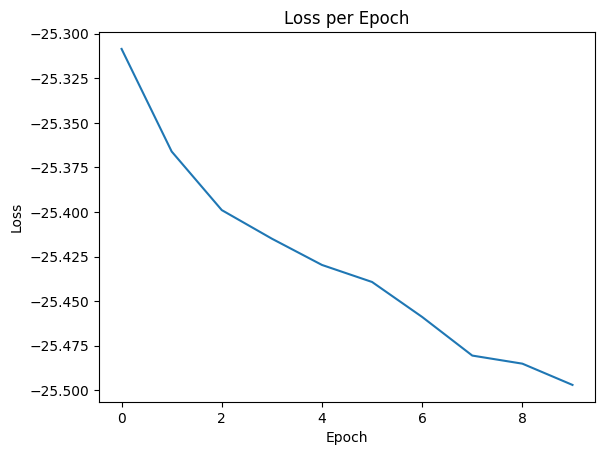

In [167]:
plt.plot(loss_per_epoch)
plt.title("Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.show()

Now let's compare our low-res input to the following three images:


*   High-Res, Baseline Model
*   High-Res, Finetuned Model
*   High-Res, Ground Truth (Original Image)



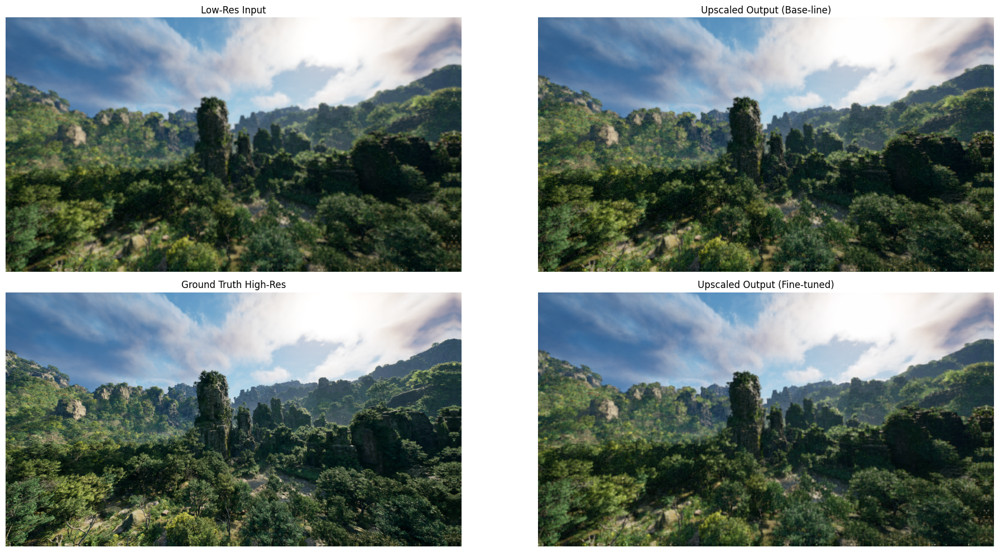

In [170]:
fig, axs = plt.subplots(2, 2, figsize=(20,10))
axs = axs.flatten()

lr_image = train_dataset[2][0].squeeze(0).permute(1, 2, 0).cpu().numpy()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

original_model = Swin2SRForImageSuperResolution.from_pretrained("caidas/swin2SR-classical-sr-x4-64").to(device)
with torch.no_grad():
    upscaled_image_baseline = original_model(train_dataset[2][0].to(device))

finetuned_model = Swin2SRForImageSuperResolution.from_pretrained("./Swin2SR-finetuned-charbonnier").to(device)
with torch.no_grad():
    upscaled_image_finetuned = finetuned_model(train_dataset[2][0].to(device))

hr_image = train_dataset[2][1].squeeze(0).permute(1, 2, 0).cpu().numpy()

upscaled_image_baseline = upscaled_image_baseline.reconstruction.data.squeeze(0).permute(1, 2, 0).cpu().numpy()
upscaled_image_finetuned = upscaled_image_finetuned.reconstruction.data.squeeze(0).permute(1, 2, 0).cpu().numpy()

axs[0].imshow(lr_image)
axs[0].set_title('Low-Res Input')
axs[0].axis('off')

axs[1].imshow(upscaled_image_baseline)
axs[1].set_title('Upscaled Output (Base-line)')
axs[1].axis('off')

axs[3].imshow(upscaled_image_finetuned)
axs[3].set_title('Upscaled Output (Fine-tuned)')
axs[3].axis('off')

axs[2].imshow(hr_image)
axs[2].set_title('Ground Truth High-Res')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Let's create a function to evaluate our models quantitatively.

In [174]:
from tqdm import trange

def evaluate_metrics(baseline_model, finetuned_model, dataset):
    psnr_baseline = []
    psnr_finetuned = []
    ssim_baseline = []
    ssim_finetuned = []

    for i in trange(len(dataset)):
        lr_image, hr_image = train_dataset[i]

        with torch.no_grad():
            # predict
            upscaled_image_baseline = original_model(train_dataset[i][0].to(device))
            upscaled_image_finetuned = finetuned_model(train_dataset[i][0].to(device))

        hr_PIL = Image.fromarray((hr_image.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))
        lr_PIL = Image.fromarray((lr_image.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))

        upscaled_baseline_PIL = Image.fromarray((upscaled_image_baseline.reconstruction.data.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))
        upscaled_finetuned_PIL = Image.fromarray((upscaled_image_finetuned.reconstruction.data.squeeze(0).permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8))

        baseline_psnr = calculate_psnr(hr_PIL, upscaled_baseline_PIL)
        finetuned_psnr = calculate_psnr(hr_PIL, upscaled_finetuned_PIL)

        baseline_ssim = calculate_ssim(hr_PIL, upscaled_baseline_PIL)
        finetuned_ssim = calculate_ssim(hr_PIL, upscaled_finetuned_PIL)

        psnr_baseline.append(baseline_psnr)
        psnr_finetuned.append(finetuned_psnr)
        ssim_baseline.append(baseline_ssim)
        ssim_finetuned.append(finetuned_ssim)

    return np.mean(psnr_baseline), np.mean(psnr_finetuned), np.mean(ssim_baseline), np.mean(ssim_finetuned)

Let's compare our baseline and finetuned models against our ground truth images to see, on average, how our model does across all the images!

In [175]:
psnr_baseline, psnr_finetuned, ssim_baseline, ssim_finetuned = evaluate_metrics(original_model, finetuned_model, train_dataset)

100%|██████████| 250/250 [11:08<00:00,  2.67s/it]


In [177]:
print(f"PSNR (Base-line): {psnr_baseline:.2f} dB")
print(f"PSNR (Fine-tuned): {psnr_finetuned:.2f} dB")
print(f"SSIM (Base-line): {ssim_baseline:.4f}")
print(f"SSIM (Fine-tuned): {ssim_finetuned:.4f}")

PSNR (Base-line): 25.05 dB
PSNR (Fine-tuned): 24.80 dB
SSIM (Base-line): 0.7671
SSIM (Fine-tuned): 0.7542
